# Demo 1: Selecting Scenarios from a Monte Carlo Simulation

This demonstration shows how to use the ScenarioSelector algorithm to select a maximal subset of a scanario set, so that the selected scenarios have a chosen mean path.

You can install the scenarioselector package from [Python Package Index](https://pypi.org/project/scenarioselector/) with the command `pip install scenarioselector`.

We create a scenario set by simulating an Ornstein Uhlenbeck stochastic process using the Monte Carlo method. This type of mean reverting, random process is often used in mathematical finance, and the physical sciences. The dynamics of the process are described by the stochastic differential equation

\begin{equation}
  \mathrm{d}r_t = \alpha \, (\mu - r_t) \, \mathrm{d}t + \sigma \, \mathrm{d}W_t,
\end{equation}

where $W=(W_t)_{t\ge 0}$ is a standard driving Brownian motion. We use the following variables to represent the parameters in code.

| Parameter  | Variable               | Value   |
|------------|------------------------|---------|
|  $r_0$     | `initial_value`        | $2\%$   |
|  $\alpha$  | `mean_reversion_speed` | $12\%$  |
|  $\mu$     | `mean_reversion_level` | $4\%$   |
|  $\sigma$  | `volatility`           | $0.7\%$ |

In [1]:
initial_value        = 0.02
mean_reversion_speed = 0.12
mean_reversion_level = 0.04
volatility           = 0.007

Let's create our scenario set by sampling $10,000$ scenarios of the process<sup>[1](#footnotes)</sup>. We use a numpy array, `r`, to store the scenario set. The columns of `r` represent times; the rows represent random scenarios (also known as observations or 'trials'). Thus, each column slice `r[:, i]` represents $10,000$ observations of $r_t$ at time $t = i\;\times$ `dt`, where `dt` is the length of each time step.

In [2]:
import numpy as np; np.random.seed(0)

trials  = 10000
steps   = 50
dt      = 1

r       = np.empty((trials, steps + 1))
r[:, 0] = initial_value
dZ      = np.random.normal(size=(trials, steps))

for i in range(steps):
    r[:, i + 1] = (mean_reversion_speed * mean_reversion_level * dt +
                   r[:, i] * (1 - mean_reversion_speed * dt) +
                   volatility * np.sqrt(dt) * dZ[:, i])

Let's plot a fan chart, which displays the distribution of the scenario set as a function of time.

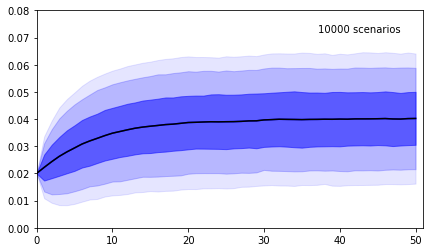

In [3]:
from scenarioselector.graphics import FanChart

levels = (5, 10, 25, 75, 90, 95)
percentiles = np.percentile(r, levels, axis=0)
mean = np.average(r, axis=0)

fan_chart = FanChart(trials, percentiles, mean, levels, ylim=(0, 0.08))

The fan chart shows the 5th, 10th, 25th, 75th, 90th and 95th percentiles of the $10,000$ scenarios. The black line at the center represents the mean path of the observations. The mean path of an Ornstein Uhlenbeck process can take a limited number of possible shapes, depending on the parameters $r_0$, $\mu$ and $\alpha$:

\begin{equation}
  \operatorname{E}[r_t] = e^{-\alpha t} r_0 + (1 - e^{-\alpha t}) \mu.
\end{equation}

Suppose we want to "thin out" the 10,000 scenarios, so the mean of the remaining, selected scenarios follows a path which we believe to be more plausible.

In [4]:
target_times = np.arange(1, 41)
target_means = (0.021305121, 0.022613229, 0.023763462, 0.024578678,
                0.025291511, 0.026118500, 0.027015677, 0.028291032,
                0.031389176, 0.037338834, 0.044991486, 0.052744166,
                0.056295312, 0.056633222, 0.056056241, 0.054914268,
                0.053414268, 0.051914268, 0.050414268, 0.048914268,
                0.047414268, 0.045914268, 0.044414268, 0.042914268,
                0.041414268, 0.039914268, 0.038414268, 0.037114268,
                0.036014268, 0.035514268, 0.035514268, 0.036514268,
                0.037014268, 0.037314268, 0.037514268, 0.037714268,
                0.037914268, 0.038114268, 0.038314268, 0.038514268)

Let's show the fan chart above, this time superimposing a <font color='red'>red path</font> which plots the `target_means` against the `target_times`. The target mean may, for example, be economically justifiable, or it could represent a stress of some kind.

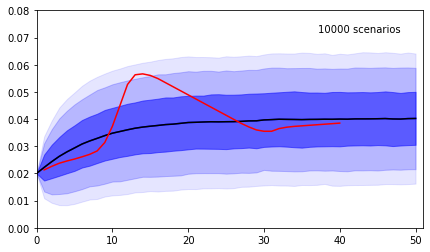

In [5]:
fan_chart = FanChart(trials, percentiles, mean, levels, target_times, target_means, ylim=(0, 0.08))

Let's instantiate a ScenarioSelector object, constructed from the targeted cross-sectional slices of the scenario set, and the `target_mean` path.

In [6]:
from scenarioselector import ScenarioSelector

target_slices = r[:, target_times]
selector = ScenarioSelector(target_slices, means=target_means)

At this stage the scenario selection problem has been defined. We have not specified weights for the data in this example, so the ScenarioSelector assumes equal weights for each observation.

Call the ScenarioSelector's optimize method to run the modified simplex algorithm, which uses 'pivot' and 'flip' operations to solve a linear program. The linear program selects a maximal subset of the scenario set, such that the reduced scenario set has the target mean.

In [7]:
selector.optimize()

reduced_trials = np.sum(selector.selected)

report_string = "Selected {} of the {} observations, using {} pivots."
print(report_string.format(reduced_trials, trials, selector.pivot_count))

Selected 514 of the 10000 observations, using 241 pivots.


When the target mean path represents an extreme stress<sup>[2](#footnotes)</sup> only a small number of scenarios will be selected; in this example, only 514 of the original 10,000 scenarios have been selected.

To illustrate the effect of the optimization, we calculate the percentiles and the mean path of the reduced data set.

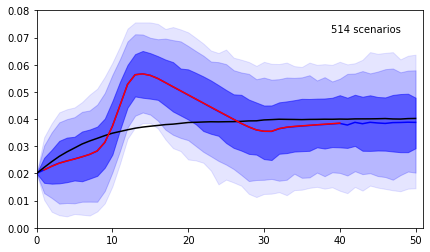

In [8]:
from IPython.display import display

reduced_data        = r[selector.selected]
reduced_percentiles = np.percentile(reduced_data, levels, axis=0)
reduced_mean        = np.average(reduced_data, axis=0)

fan_chart.update(reduced_trials, reduced_percentiles, reduced_mean)
display(fan_chart.fig)

Notice that the volatility structure of the scenario set is well preserved. The blue mean path, emanating from the right of the red target path, represents the mean of the selected scenarios conditioned on the target.

A callback function can be passed to the ScenarioSelector's optimize method, enabling us to track progress during the optimization. For example, to give a visual demonstration of the algorithm, we could use the callback function to record information about the selected scenarios after each pivot. 

\[Warning: The next two code blocks take approximately 2 minutes each to execute! We have chosen a significantly less efficient pivot rule because because it gives a better demonstration of the progress.\]

In [9]:
from scenarioselector.pivot_rule import PivotRule
from scenarioselector.pivot_variable import DantzigTwoPhase
from scenarioselector.pivot_scenarios import pivot_scenarios

percentiles_list, num_selected_list, mean_list = [], [], []

def callback(selector, i, element):
    if i % 50: return
    num_selected = np.sum(selector.selected)
    reduced_data = r[selector.selected]
    percentiles  = np.percentile(reduced_data, levels, axis=0)
    mean         = np.average(reduced_data, axis=0)
    num_selected_list.append(num_selected)
    percentiles_list.append(percentiles)
    mean_list.append(mean)

selector = ScenarioSelector(target_slices, means=target_means)

pivot_rule = PivotRule(DantzigTwoPhase, pivot_scenarios)
selector.optimize(callback, pivot_rule)

print(report_string.format(sum(selector.selected), trials, selector.pivot_count))

Selected 514 of the 10000 observations, using 18190 pivots.


Using the `percentiles_list`, `mean_list` and `num_selected_list` collected by the callback function, we can animate the ScenarioSelector's progress after each pivot.

In [10]:
from matplotlib import rc; rc('animation', html='jshtml')
from matplotlib.animation import FuncAnimation

FuncAnimation(fan_chart.fig, fan_chart.animate,
              frames=len(percentiles_list), interval=10,
              blit=True, repeat=False,
              fargs=(num_selected_list, percentiles_list, mean_list))

## Footnotes

1. We use a crude Euler–Maruyama approximation in the code above to simulate the process, rather than a distributionally exact solution of the SDE.
1. By an 'extreme stress', we mean that the target lies in the tails of the distribution of the original scenario set